### Домашка

1. Скачать [датасет по ссылке](https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv) (просто запустить строку ниже)

In [38]:
!wget https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv

--2025-11-02 16:39:58--  https://raw.githubusercontent.com/tyqiangz/multilingual-sentiment-datasets/refs/heads/main/data/english/test.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102826 (100K) [text/plain]
Saving to: ‘test.csv.7’

test.csv.7          100%[===================>] 100.42K  --.-KB/s    in 0.002s  

2025-11-02 16:39:58 (53.0 MB/s) - ‘test.csv.7’ saved [102826/102826]



2. Открыть csv и сохранить текст в переменную (макс. балл == 1)

In [39]:
import pandas as pd #импортирую все необходимое для работы с таблицами
import numpy as np

df = pd.read_csv('test.csv', encoding='utf-8-sig')
#df.head(5) #проверяю, что таблица открылась

text_l = list(df['text']) #создаю переменную text_l, в которой в виде списка хранятся данные из столбца text
#print(text_l) #проверяю, что получилось создать переменную



3. Извлечь столбец с текстами (макс. балл == 1)

In [40]:
text = df["text"] #создаю переменую text, в которой хранятся данные из столбца text
#print(text) #вывожу все строки из столбца text
#я не совсем понимаю, зачем этот шаг, если мы сохраняли текст в переменную до этого. просто для наглядности?

4. Построить Bag-of-Words (макс. балл == 3)

In [41]:
!pip install gensim #импортирую все необходимое
import gensim
import gensim.downloader as api
from gensim import corpora
from gensim.models import TfidfModel
from pprint import pprint
import re

In [42]:
# Задача 1.1: Создайте словарь и BoW представление (макс. балл == 2)

# чистка текста, удаление знаков препинания
text_lc = [] #создаю новый список, куда буду добавлять почищенный текст

for el in text_l: #перебираю предложения из списка
  el_c = re.sub(r'[^a-zA-Z ]', ' ', el) #заменяю все кроме букв и пробелов на пробел (можно поставить еще ограничения, например, на хештеги)
  el_c = re.sub(r'\s+', ' ', el_c) #заменяю все множественные пробелы на один пробел
  text_lc.append(el_c) #добавляю новые чистые предложения в новый список

#print(text_lc) #вывожу новый список, чтобы посмотреть все ли сработало

#токенизация и приведение всего в нижний регистр
tokenized_docs = [doc.lower().split() for doc in text_lc] #делаю токенизацию и тут же привожу все к нижнему регистру
#print(tokenized_docs) #вывожу токенизированные списки, чтобы убедиться, что все работает

#создаю словарь
dictionary = corpora.Dictionary(tokenized_docs) #создаю словарь и записываю в него токены
#print(dictionary.token2id) #выводу словарь, чтобы убедиться, что все работает

#создаю Bag-of-Words представление
bow_corpus = [dictionary.doc2bow(doc) for doc in tokenized_docs]
for i, doc_vec in enumerate(bow_corpus, 1): #перебираю предложения и вывожу результаты создания Bag-of-Words представление
    print(f"Документ {i}: {doc_vec}")

#создаю векторы
def bow_to_dense(bow_corpus, dictionary):
    dense_vectors = []
    for doc in bow_corpus:
        dense_vec = [0] * len(dictionary)
        for idx, freq in doc:
            dense_vec[idx] = freq
        dense_vectors.append(dense_vec)
    return dense_vectors

dense_vectors = bow_to_dense(bow_corpus, dictionary)
print("Слова:", list(dictionary.token2id.keys()))
for i, vec in enumerate(dense_vectors, 1):
    print(f"Док {i}: {vec}")


Документ 1: [(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1)]
Документ 2: [(18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)]
Документ 3: [(0, 2), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1)]
Документ 4: [(17, 1), (38, 4), (40, 1), (41, 2), (42, 1), (43, 2), (44, 1), (45, 1), (46, 1), (47, 1), (48, 2), (49, 1), (50, 1), (51, 2)]
Документ 5: [(52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1)]
Документ 6: [(8, 2), (10, 1), (14, 1), (30, 1), (46, 1), (48, 2), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 2), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1)]
Документ 7: [(1, 1), (6, 1), (8, 1), (12, 1), (38, 1), (40, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

Matrix shape: (5, 60)


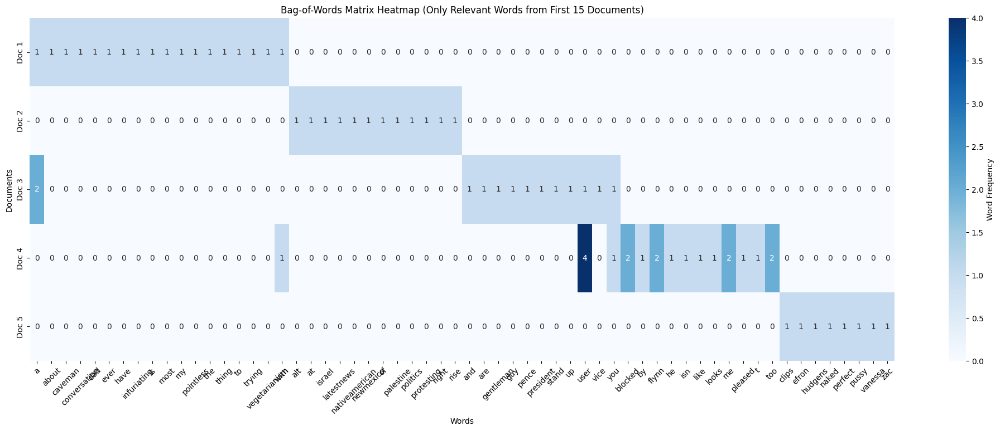

In [44]:
# Задача 1.2: Визуализируйте результаты (макс. балл == 1)

# Визуализация
matrix = np.array(dense_vectors)
words = list(dictionary.token2id.keys())
doc_names = [f"Doc {i+1}" for i in range(len(text_lc))]

#создаю подсет, чтобы создать визуализацию из первых 5 документов
#тут я попросила помощи у ИИ, потому что визуализация всех данных (как мы делали на семинаре) у меня не грузилась, а как выбрать только первые 5 документов до меня не дошло...
matrix_subset = matrix[:5, :]
df_matrix = pd.DataFrame(matrix_subset, columns=words)
filtered_words = df_matrix.columns[(df_matrix > 0).any(axis=0)]
filtered_matrix = df_matrix.loc[:, filtered_words].values


doc_names_subset = doc_names[:5]

print(f"Matrix shape: {filtered_matrix.shape}")

plt.figure(figsize=(25, 8))

#строю heatmap матрицы BoW
sns.heatmap(filtered_matrix,
            annot=True,
            fmt="d",
            xticklabels=filtered_words,
            yticklabels=doc_names_subset,
            cmap="Blues",
            cbar_kws={"label": "Word Frequency"})
plt.title("Bag-of-Words Matrix Heatmap (Only Relevant Words from First 15 Documents)")
plt.xticks(rotation=45)
plt.ylabel("Documents")
plt.xlabel("Words")

plt.show()

#самое частое слово в 5-ти первых документах - слово "user"

In [10]:
# Задача 1.2: Визуализируйте результаты (макс. балл == 1)

# это код для визуализации всех данных, но на моем ноутбуке он не может прогрузиться


# Визуализация
matrix = np.array(dense_vectors)
words = list(dictionary.token2id.keys())
doc_names = [f"Doc {i+1}" for i in range(len(text_lc))]

print(f"Matrix shape: {matrix.shape}")

plt.figure(figsize=(25, 6))

#строю heatmap матрицы BoW
plt.subplot(1, 2, 1)
sns.heatmap(matrix,
            annot=True,
            fmt='d',
            xticklabels=words,
            yticklabels=doc_names,
            cmap='Blues',
            cbar_kws={'label': 'Word Frequency'})
plt.title('Bag-of-Words Matrix Heatmap')
plt.xticks(rotation=45)
plt.ylabel('Documents')
plt.xlabel('Words')


Matrix shape: (870, 3869)


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7ed56ccddee0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7ed56ccdd940> (for post_execute):


KeyboardInterrupt: 

5. Построить TF-IDF (макс. балл == 5)

In [47]:
# Задача 2.1: Примените TF-IDF к BoW представлению (макс. балл == 2)
# - Получите TF-IDF векторы для каждого документа

#использую TfidfModel
tfidf_model = TfidfModel(bow_corpus)
tfidf_corpus = tfidf_model[bow_corpus]

#Нахожу TF-IDF векторы для каждого документа
for i, doc_vec in enumerate(tfidf_corpus, 1):
    print(f"Документ {i}: {[(dictionary[idx], round(score, 3)) for idx, score in doc_vec]}")



# Задача 2.2: Проанализируйте веса TF-IDF (макс. балл == 3)

#использую функцию, прикрепленную ниже
def analyze_tfidf_components(bow_corpus, dictionary):
    #создаю матрицу TF (term frequency)
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for doc_idx, doc in enumerate(bow_corpus):
        for word_idx, freq in doc:
            tf_matrix[doc_idx, word_idx] = freq

    #вычисляю DF (document frequency)
    df_vector = np.sum(tf_matrix > 0, axis=0)  # Количество документов с каждым словом

    #вычисляею IDF (inverse document frequency)
    N = len(bow_corpus)  # общее количество документов
    idf_vector = np.log(N / (df_vector + 1)) + 1

    #вычисляю TF-IDF
    tfidf_manual = tf_matrix * idf_vector

    return tf_matrix, df_vector, idf_vector, tfidf_manual


#сохранение в сsv
# тут я тоже пользовалась ии, потому что как сохранить что-либо в csv я знаю, но не понимаю, как сделать это конкретно в данном случае
# мне в общем понятна работа кода, но оформить результат в таблицу, чтобы были колонки со значениями tf_matrix, df_vector, idf_vector, tfidf_manual, я сама не смогла


# Выполнение анализ
tf_matrix, df_vector, idf_vector, tfidf_manual = analyze_tfidf_components(bow_corpus, dictionary)

# Получение полного списка слов
word_list = list(dictionary.values())

# Создаем DataFrame для хранения результатов
data = {
    "Word": word_list,
    "TF_Matrix_Avg": np.mean(tf_matrix, axis=0),
    "DF_Vector": df_vector,
    "IDF_Vector": idf_vector,
    "TF_IDF_Manual": np.mean(tfidf_manual, axis=0)
}

# Конструирование DataFrame
results_df = pd.DataFrame(data)

# Сохранение в CSV
results_df.to_csv("tf-idf-analysis-detailed.csv", index=False)

# Просмотр первых записей
print(results_df.head())


# - Прикрепите *.csv в ваш репозиторий

Документ 1: [('a', np.float64(0.076)), ('about', np.float64(0.163)), ('caveman', np.float64(0.35)), ('conversation', np.float64(0.35)), ('dad', np.float64(0.314)), ('ever', np.float64(0.257)), ('have', np.float64(0.149)), ('infuriating', np.float64(0.35)), ('is', np.float64(0.087)), ('most', np.float64(0.21)), ('my', np.float64(0.148)), ('pointless', np.float64(0.35)), ('the', np.float64(0.055)), ('thing', np.float64(0.236)), ('to', np.float64(0.069)), ('trying', np.float64(0.293)), ('vegetarianism', np.float64(0.226)), ('with', np.float64(0.132))]
Документ 2: [('alt', np.float64(0.232)), ('at', np.float64(0.167)), ('israel', np.float64(0.241)), ('latestnews', np.float64(0.381)), ('nativeamerican', np.float64(0.381)), ('newmexico', np.float64(0.381)), ('of', np.float64(0.089)), ('palestine', np.float64(0.264)), ('politics', np.float64(0.303)), ('protesting', np.float64(0.342)), ('right', np.float64(0.193)), ('rise', np.float64(0.319))]
Документ 3: [('a', np.float64(0.193)), ('and', np.

Это дз в целом показалось очень сложным, поэтому пришлось пребегнуть к помощи ИИ, хотя я против такого способа решения дз...

##### **Как вычислить компоненты вручную**

```python
def analyze_tfidf_components(bow_corpus, dictionary):
    # Шаг 1: Создаем матрицу TF (term frequency)
    tf_matrix = np.zeros((len(bow_corpus), len(dictionary)))
    for doc_idx, doc in enumerate(bow_corpus):
        for word_idx, freq in doc:
            tf_matrix[doc_idx, word_idx] = freq
    
    # Шаг 2: Вычисляем DF (document frequency)
    df_vector = np.sum(tf_matrix > 0, axis=0)  # Количество документов с каждым словом
    
    # Шаг 3: Вычисляем IDF (inverse document frequency)
    N = len(bow_corpus)  # общее количество документов
    idf_vector = np.log(N / (df_vector + 1)) + 1
    
    # Шаг 4: Вычисляем TF-IDF вручную
    tfidf_manual = tf_matrix * idf_vector
    
    return tf_matrix, df_vector, idf_vector, tfidf_manual
```

6. Произвести сравните

*Эта часть не оценивается, но будет давать доп. баллы на экзамене для тех, кто выполнит её*

In [ ]:
# Сравните BoW и TF-IDF для конкретных слов
# - Выберите 3-4 слова из датасета (выберите слова, характерные для датасета)
# - Постройте графики сравнения их весов в BoW и TF-IDF

##### **Как построить сравнительный график**
```python
def compare_bow_tfidf(words, bow_dense, tfidf_dense, dictionary):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    for i, word in enumerate(words):
        row, col = i // 2, i % 2
        word_id = dictionary.token2id[word]
        
        # Веса для этого слова во всех документах
        bow_weights = [doc[word_id] for doc in bow_dense]
        tfidf_weights = [doc[word_id] for doc in tfidf_dense]
        
        x = range(len(bow_dense))
        axes[row, col].bar(x, bow_weights, alpha=0.7, label='BoW', width=0.4)
        axes[row, col].bar([p + 0.4 for p in x], tfidf_weights, alpha=0.7, label='TF-IDF', width=0.4)
        axes[row, col].set_title(f'Сравнение весов: "{word}"')
        axes[row, col].legend()
        axes[row, col].set_xticks([p + 0.2 for p in x])
        axes[row, col].set_xticklabels([f'Док {i+1}' for i in x])
    
    plt.tight_layout()
    plt.show()
```